In [6]:
import pytesseract
import cv2
import numpy as np
import matplotlib.pyplot as plt

Read and display image

In [7]:
img_path="E:\OCR\page.jpg"
img=cv2.imread(img_path)

In [17]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

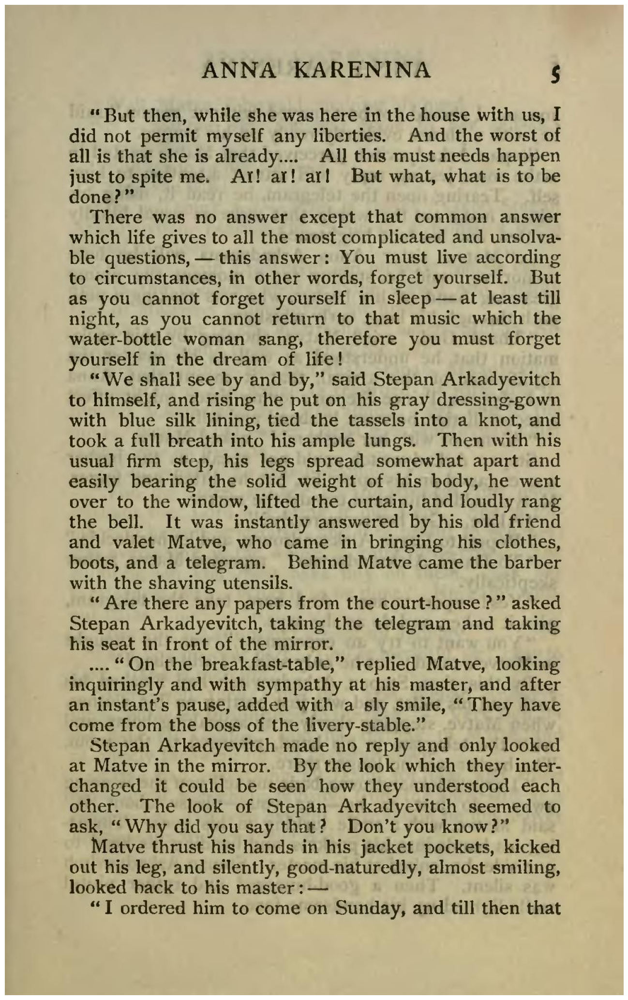

In [18]:
display("E:\OCR\page.jpg")

INVERSION

In [14]:
inv_img=cv2.bitwise_not(img)

In [20]:
cv2.imwrite("temp\inv_img.png",inv_img)

True

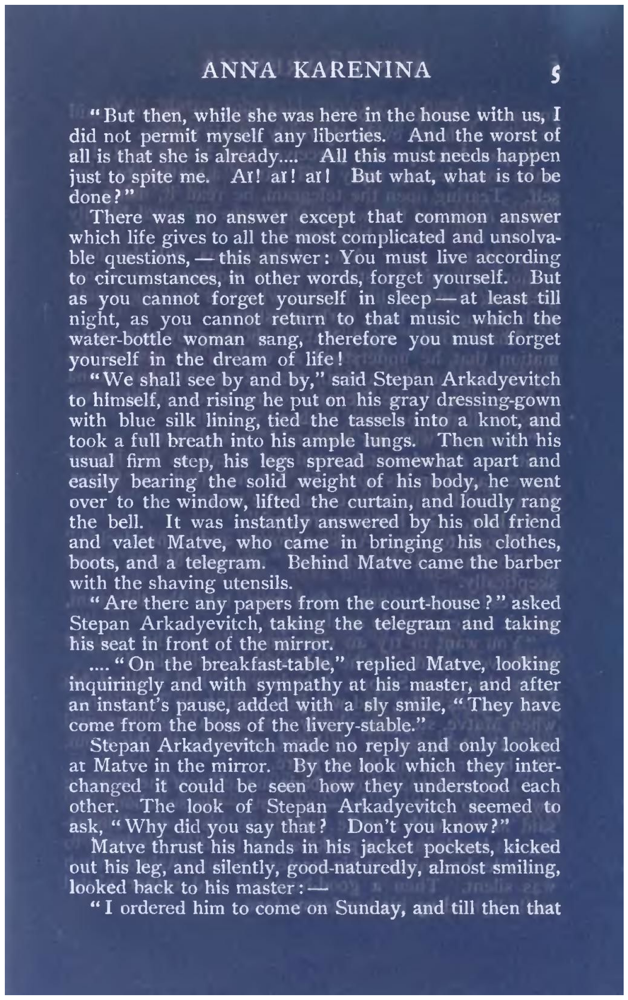

In [21]:
display("temp\inv_img.png")

BINARIZATION

In [22]:
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [23]:
gray_img=grayscale(img)
cv2.imwrite("temp\gray_img.png",gray_img)

True

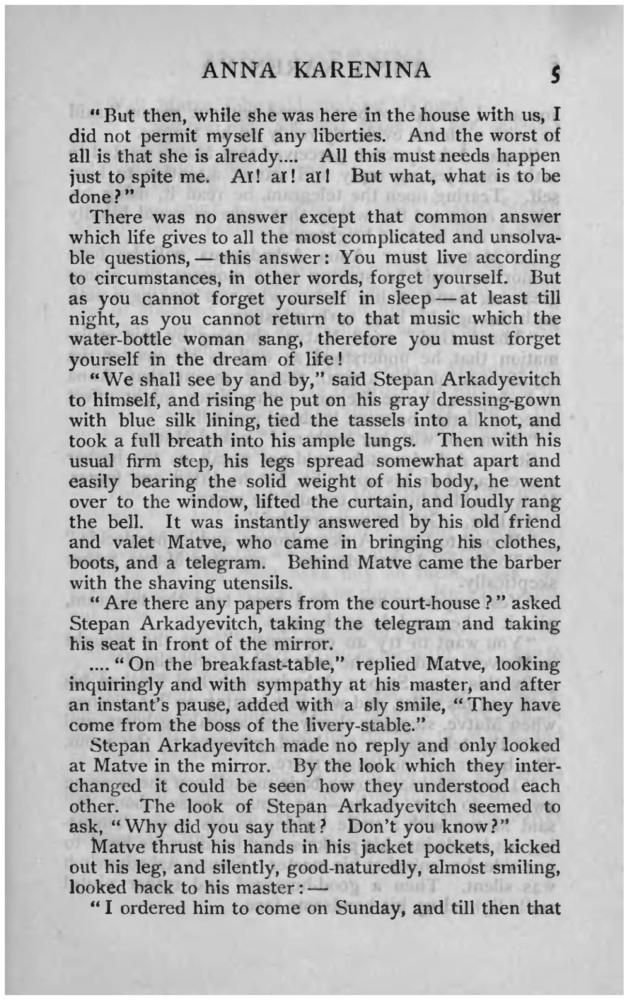

In [24]:
display("temp\gray_img.png")

In [35]:
thresh, im_bw = cv2.threshold(gray_img, 127, 255, cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg", im_bw)

True

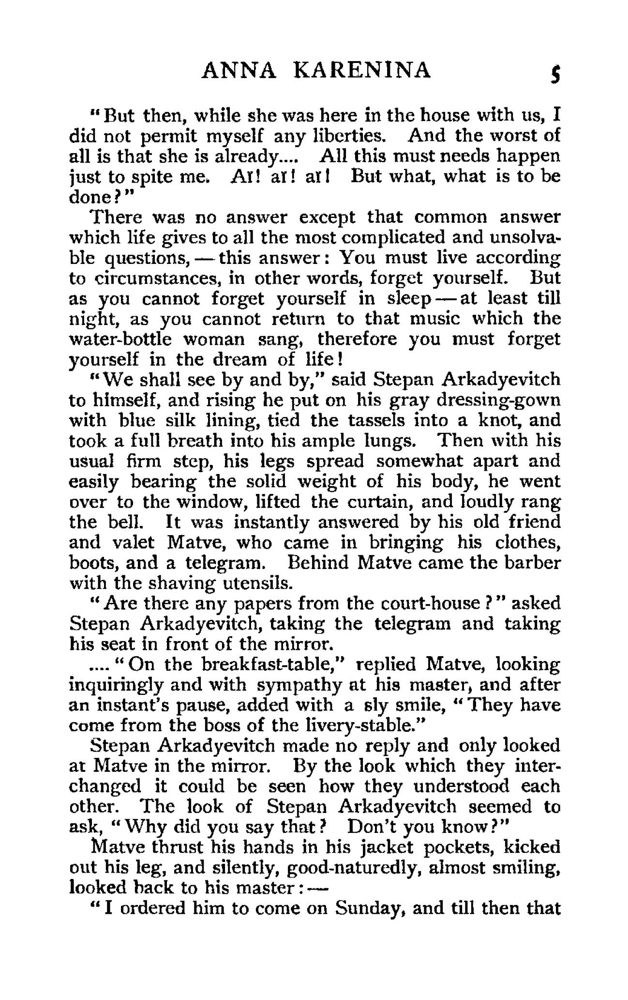

In [36]:
display("temp/bw_image.jpg")

NIOSE REMOVAL

In [37]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [38]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.png", no_noise)

True

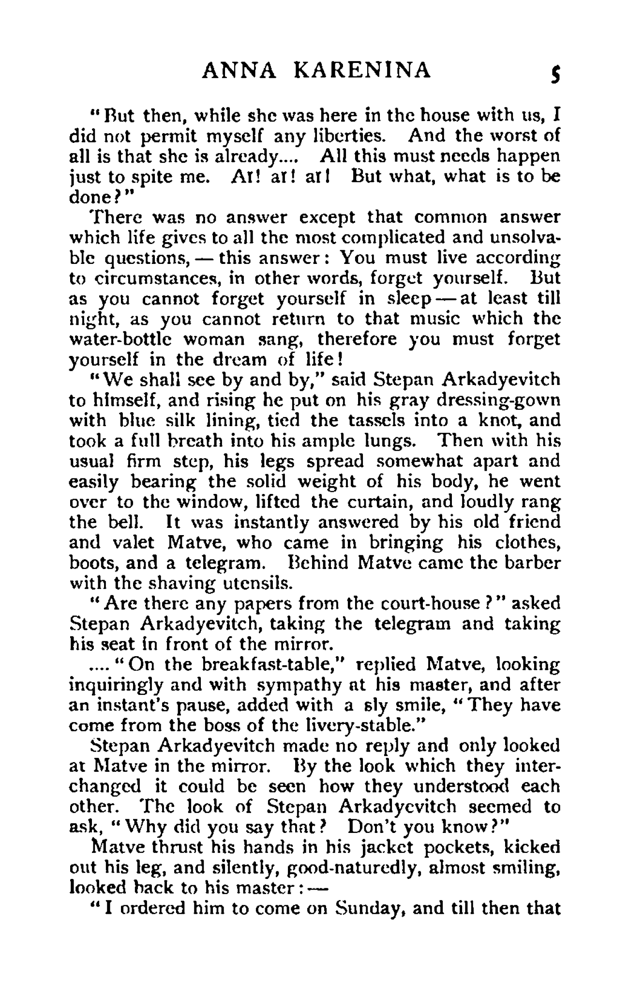

In [40]:
display("temp/no_noise.png")

OCR

In [41]:
from PIL import Image

In [44]:
file_path="temp/no_noise.png"

In [45]:
image=Image.open(file_path)

In [46]:
ocr=pytesseract.image_to_string(image)

In [47]:
print(ocr)

ANNA KARENINA 5

“But then, while she was here in the house with us, I
did not permit myself any liberties. And the worst of
all is that she is already... All this must needs happen
just to spite me. Ar! ar! ar! But what, what is to be
done?”

There was no answer except that common answer
which life gives to all the most complicated and unsolva-
ble questions, — this answer: You must live according
to circumstances, in other words, forget yourself. But
as you cannot forget yourself in sleep—at least till
night, as you cannot return to that music which the
water-bottle woman sang, therefore you must forget
yourself in the dream of life!

“We shall see by and by,” said Stepan Arkadyevitch
to himself, and rising he put on his gray dressing-gown
with blue silk lining, tied the tassels into a knot, and
took a full breath into his ample lungs. Then with his
usual firm step, his legs spread somewhat apart and
easily bearing the solid weight of his body, he went
over to the window, lifted the 